# Mini example on scrnaseq analysis

A mini example of scRNA-Seq analysis based on tabula muris senis large intestine data 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc

In [2]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

/Users/feifei/miniconda3/envs/scrna-macro/bin/python
3.6.12 | packaged by conda-forge | (default, Dec  9 2020, 00:24:39) 
[GCC Clang 11.0.0]
sys.version_info(major=3, minor=6, micro=12, releaselevel='final', serial=0)
scanpy==1.7.1 anndata==0.7.5 umap==0.4.6 numpy==1.19.5 scipy==1.5.3 pandas==1.1.5 scikit-learn==0.24.1 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
sc.settings.set_figure_params(dpi=80)

In [4]:
work_dir = './data/'

In [5]:
adata = sc.read_h5ad(work_dir + 'facs_large_intestine.raw.h5ad')
adata

AnnData object with n_obs × n_vars = 9177 × 54444
    obs: 'n_genes_by_counts', 'total_counts', 'FACS.selection', 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'sex', 'subtissue', 'tissue', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ERCC', 'pct_counts_ERCC'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'ribo', 'hb', 'ERCC'
    uns: 'tissue_colors'

In [6]:
adata.X[:10,:10]

array([[  0.,   0., 325.,   1.,   0.,   0.,  23.,   0., 436.,   0.],
       [  0.,   0., 261.,   0.,   0.,   0.,   0.,   0., 187.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  26.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   2.,   0.,   0.,   0.],
       [218.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 122.,   0.]],
      dtype=float32)

## No filtering

In [7]:
sc.pp.normalize_total(adata, exclude_highly_expressed=True)
sc.pp.log1p(adata)

# Store normalized counts in the raw slot.
# We will subset adata.X for variable genes, but want to keep all genes matrix as well.
adata.raw = adata
adata

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['1700019C18Rik', '2200002D01Rik', '9530053A07Rik', 'Abhd14a', 'Abhd2', 'Acot2', 'Actb', 'Agr2', 'Akap12', 'Apoe', 'Arid1a', 'Atp5j', 'Bpifa1', 'Brd8', 'Brd9', 'Btg3', 'CT010467.1', 'Calm1', 'Canx', 'Car1', 'Ccdc85c', 'Cdkn1b', 'Cela1', 'Cela2a', 'Chga', 'Chgb', 'Clca1', 'Clk1', 'Crip1', 'Crip2', 'Ctrb1', 'Cyp2s1', 'Dazap2', 'Dctn4', 'Defa24', 'Derl1', 'Dnajb1', 'Dusp1', 'ERCC-00002', 'ERCC-00003', 'ERCC-00004', 'ERCC-00009', 'ERCC-00025', 'ERCC-00035', 'ERCC-00042', 'ERCC-00043', 'ERCC-00046', 'ERCC-00074', 'ERCC-00076', 'ERCC-00092', 'ERCC-00096', 'ERCC-00108', 'ERCC-00113', 'ERCC-00116', 'ERCC-00126', 'ERCC-00130', 'ERCC-00136', 'ERCC-00145', 'ERCC-00171', 'Fabp2', 'Fam3c', 'Fcgbp', 'Foxo3', 'Fth1', 'Ftl1', 'Gcg', 'Gm10800', 'Gm26917', 'Gp2', 'Gpx3', 'Gsn', 'Gstm1', 'Guca2a', 'H2-Aa', 'H2-Ab1', 'H2-Eb1', 'H2-T23', 'Hba-a1', 'Hbb-bs', 'Hbb-bt', 'Hexim2', 'Iapp'

AnnData object with n_obs × n_vars = 9177 × 54444
    obs: 'n_genes_by_counts', 'total_counts', 'FACS.selection', 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'sex', 'subtissue', 'tissue', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ERCC', 'pct_counts_ERCC'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'ribo', 'hb', 'ERCC'
    uns: 'tissue_colors', 'log1p'

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Highly variable genes: 5462


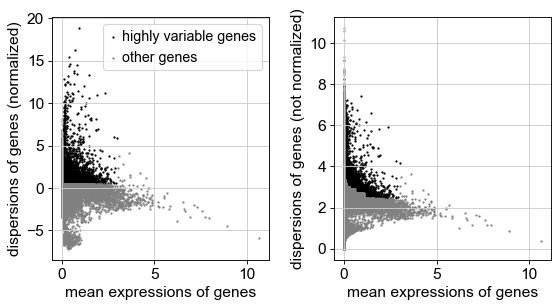

In [8]:
# Compute variable genes
#sc.pp.highly_variable_genes(adata, min_mean=0.1, max_mean=6, min_disp=0.5)
sc.pp.highly_variable_genes(adata, flavor='cell_ranger')
print('Highly variable genes: %d' %sum(adata.var.highly_variable))

# plot variable genes
sc.pl.highly_variable_genes(adata)

/Users/feifei/miniconda3/envs/scrna-macro/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:810: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


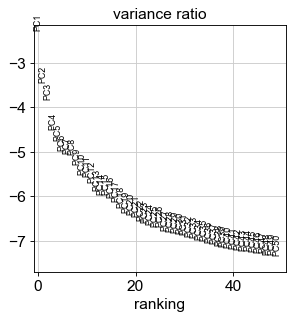

In [9]:
adata = adata[:, adata.var['highly_variable']]
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack', n_comps=50)
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


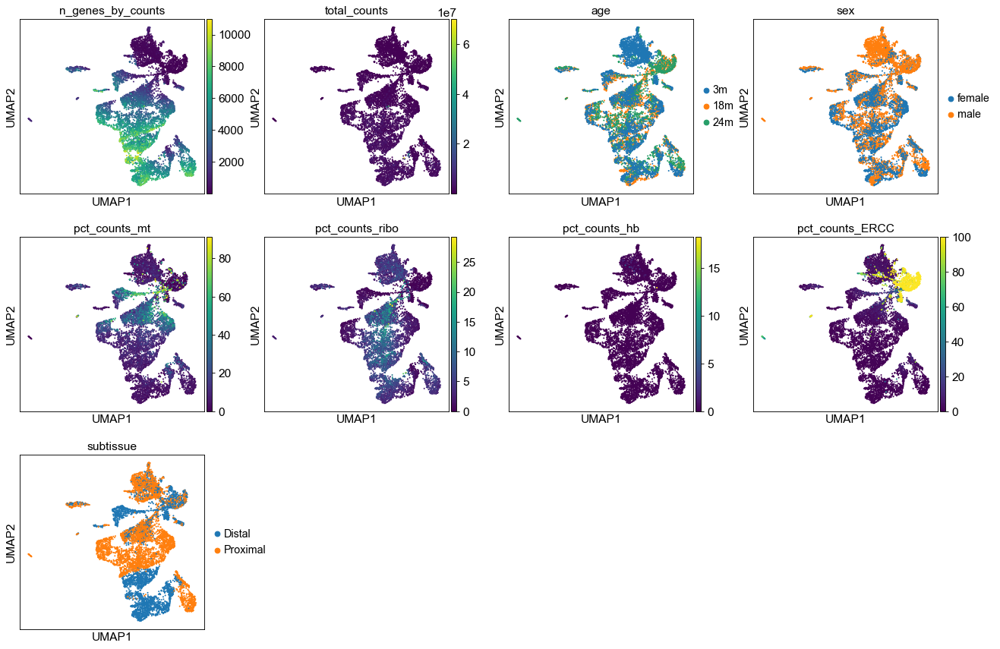

In [10]:
sc.pp.neighbors(adata, n_pcs=40, n_neighbors=20)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['n_genes_by_counts', 'total_counts', 'age', 'sex', 'pct_counts_mt', 'pct_counts_ribo',
                         'pct_counts_hb', 'pct_counts_ERCC', 'subtissue'])

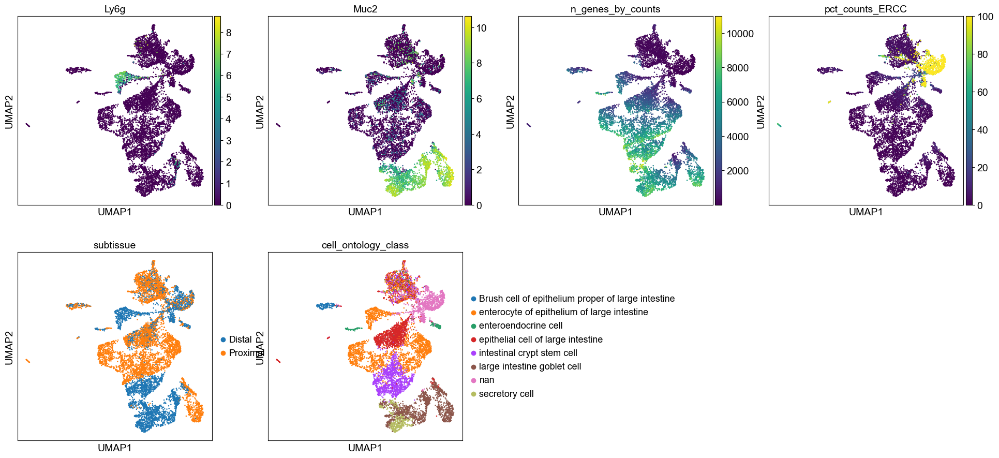

In [11]:
with plt.rc_context({"figure.figsize": (5, 5), "figure.dpi": 100, "figure.frameon": False}):
    sc.pl.umap(adata, color=['Ly6g', 'Muc2', 'n_genes_by_counts', 'pct_counts_ERCC', 'subtissue', 'cell_ontology_class'])

## Filtering

In [12]:
adata = sc.read_h5ad(work_dir + 'facs_large_intestine.raw.h5ad')
adata

AnnData object with n_obs × n_vars = 9177 × 54444
    obs: 'n_genes_by_counts', 'total_counts', 'FACS.selection', 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'sex', 'subtissue', 'tissue', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ERCC', 'pct_counts_ERCC'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'ribo', 'hb', 'ERCC'
    uns: 'tissue_colors'

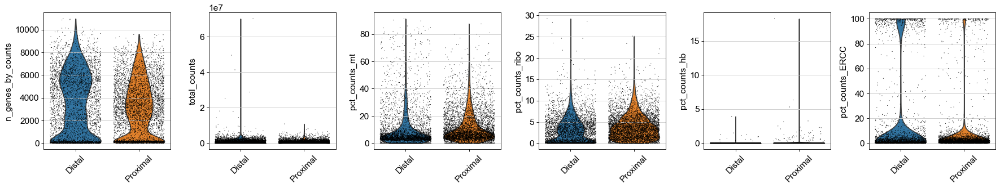

In [13]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb', 'pct_counts_ERCC'],
             jitter=0.4, groupby = 'subtissue', rotation= 45)

### by cell

In [14]:
print('Filtering cells, starting with', adata.n_obs)
sc.pp.filter_cells(adata, min_genes=500)
print('After min_genes', adata.n_obs)
sc.pp.filter_cells(adata, max_counts=1e7)
print('After max_counts', adata.n_obs)
sc.pp.filter_cells(adata, min_counts=10000)
print('After min_counts', adata.n_obs)

Filtering cells, starting with 9177


filtered out 2379 cells that have less than 500 genes expressed
filtered out 11 cells that have more than 10000000.0 counts


After min_genes 6798


filtered out 60 cells that have less than 10000 counts


After max_counts 6787
After min_counts 6727


In [15]:
# Filter on pct_ERCC < 20
print("cells %d"%adata.n_obs)
adata = adata[adata.obs['pct_counts_ERCC'] < 20, :]
print("Remaining cells %d"%adata.n_obs)

cells 6727
Remaining cells 6632


In [16]:
print("cells %d"%adata.n_obs)
adata = adata[adata.obs['pct_counts_mt'] < 40, :]
print("Remaining cells %d"%adata.n_obs)

cells 6632
Remaining cells 6361


### By gene

/Users/feifei/miniconda3/envs/scrna-macro/lib/python3.6/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)


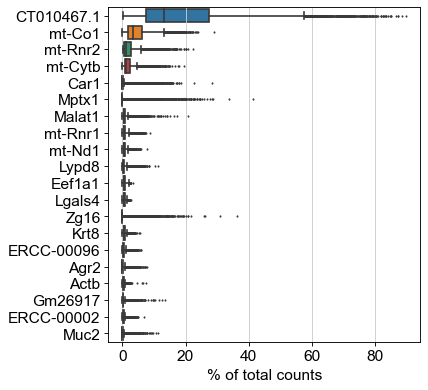

In [17]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [18]:
# We define a gene as detectable if at least 3 cells contain more than 5 reads from the gene. 
print('filtering genes, start with', adata.n_vars)
sc.pp.filter_genes(adata, min_cells=3)
print('After filetering min_cells=3', adata.n_vars)
sc.pp.filter_genes(adata, min_counts=5)
print('After filtering min_counts', adata.n_vars)

filtering genes, start with 54444


filtered out 16137 genes that are detected in less than 3 cells
filtered out 615 genes that are detected in less than 5 counts


After filetering min_cells=3 38307
After filtering min_counts 37692


In [19]:
print(adata.n_obs, adata.n_vars)
ercc_genes = adata.var_names.str.startswith('ERCC-')
malat1 = adata.var_names.str.startswith('Malat1')
mito_genes = adata.var_names.str.startswith('mt-')
rpl_genes = adata.var_names.str.startswith('Rpl')
rRNA_contamination1 = adata.var_names.str.startswith('CT010467.1')
rRNA_contamination2 = adata.var_names.str.startswith('Gm26917')



remove = np.add(mito_genes, malat1)
remove = np.add(remove, ercc_genes)
remove = np.add(remove, rpl_genes)
remove = np.add(remove, rRNA_contamination1)
remove = np.add(remove, rRNA_contamination2)
keep = np.invert(remove)

adata = adata[:,keep]

print(adata.n_obs, adata.n_vars)

6361 37692
6361 37372


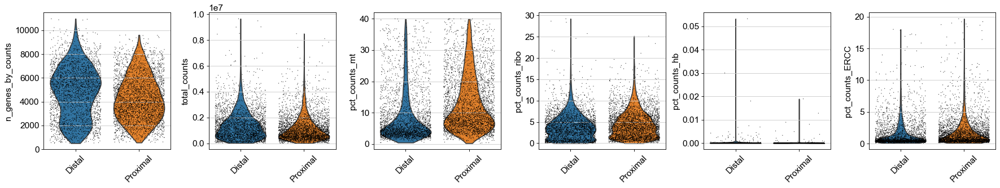

In [20]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb', 'pct_counts_ERCC'],
             jitter=0.4, groupby = 'subtissue', rotation= 45)

/Users/feifei/miniconda3/envs/scrna-macro/lib/python3.6/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)


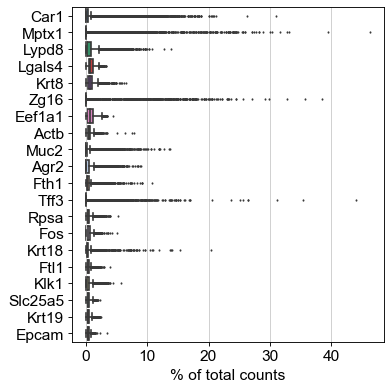

In [21]:
sc.pl.highest_expr_genes(adata, n_top=20)

### Write out filtered

In [22]:
adata.write_h5ad(work_dir + 'facs_large_intestine.raw.filtered.h5ad')

### Normalization & Dimensionality reduction

In [23]:
adata = sc.read_h5ad(work_dir + 'facs_large_intestine.raw.filtered.h5ad')

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['9530053A07Rik', 'Actb', 'Actr2', 'Agr2', 'Atp5j', 'Car1', 'Cdkn1b', 'Cdkn1c', 'Chga', 'Chgb', 'Clca1', 'Cldn4', 'Cox4i1', 'Crip1', 'Dctn4', 'Fabp2', 'Fcgbp', 'Fos', 'Foxo3', 'Fth1', 'Gcg', 'Gm10800', 'Gm10925', 'Gm23935', 'Gm28437', 'Guca2a', 'Hist1h1c', 'Ier2', 'Insl5', 'Jun', 'Kdelr2', 'Klk1', 'Krt18', 'Krt8', 'Lgals3', 'Lypd8', 'Mcmbp', 'Mptx1', 'Muc2', 'Neat1', 'Nfia', 'Pbsn', 'Phgr1', 'Ppy', 'Prdx6', 'Pyy', 'Reg3b', 'Reg3g', 'Reg4', 'Rn7sk', 'Rpsa', 'S100a6', 'Sct', 'Slc39a1', 'Smim10l1', 'Sod1', 'Spink1', 'Spink4', 'Sst', 'Sycn', 'Tff3', 'Tgm4', 'Zg16']
    finished (0:00:02)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Highly variable genes: 5975


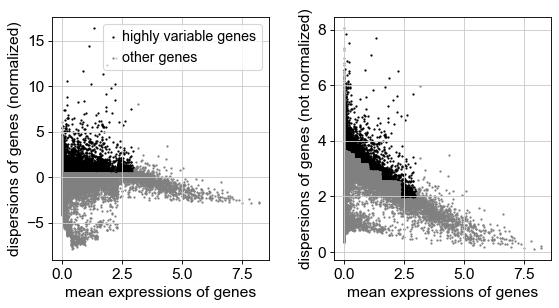

/Users/feifei/miniconda3/envs/scrna-macro/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:810: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


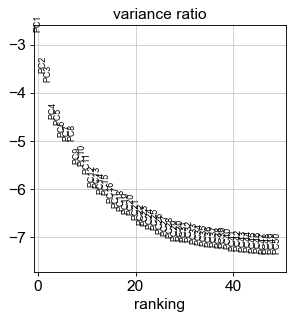

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [24]:
sc.pp.normalize_total(adata, exclude_highly_expressed=True)
sc.pp.log1p(adata)

adata.raw = adata
sc.pp.highly_variable_genes(adata, flavor='cell_ranger')
print('Highly variable genes: %d' %sum(adata.var.highly_variable))

sc.pl.highly_variable_genes(adata)

adata = adata[:, adata.var['highly_variable']]
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack', n_comps=50)
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

sc.pp.neighbors(adata, n_pcs=40, n_neighbors=20)
sc.tl.umap(adata)


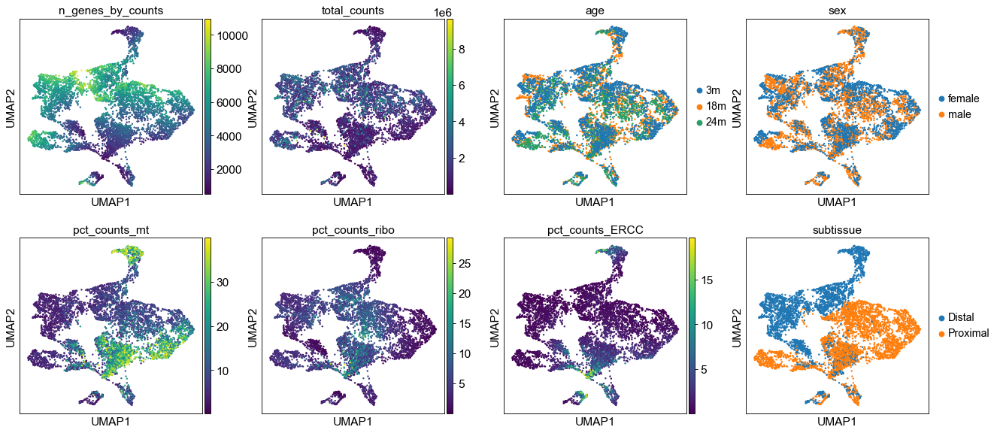

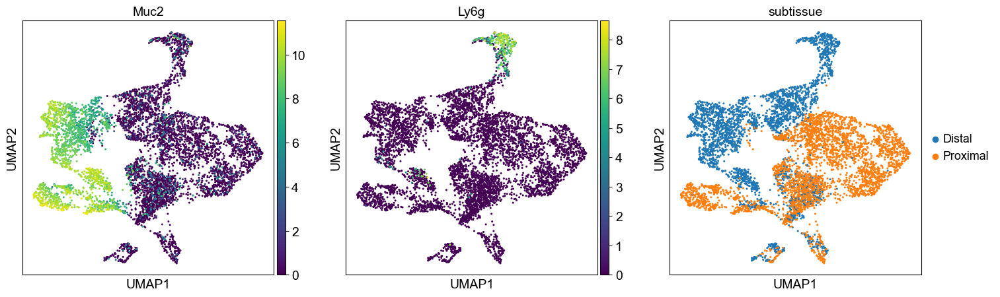

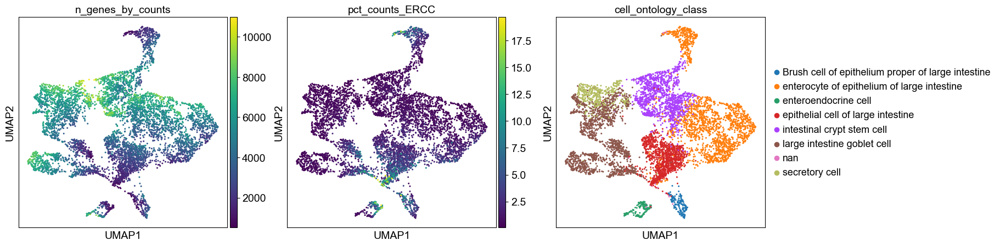

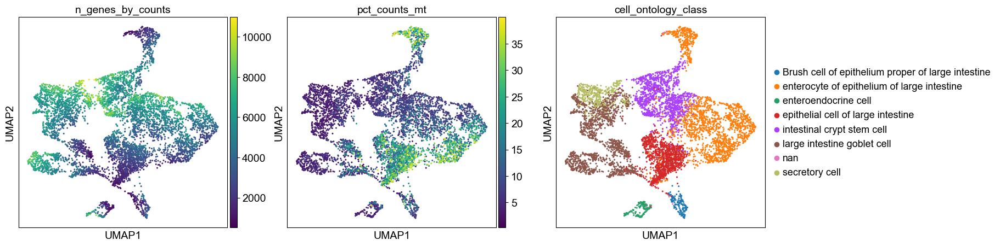

In [25]:
sc.pl.umap(adata, color=['n_genes_by_counts', 'total_counts', 'age', 'sex', 'pct_counts_mt', 'pct_counts_ribo',
                         'pct_counts_ERCC', 'subtissue'])
with plt.rc_context({"figure.figsize": (5, 5), "figure.dpi": 100, "figure.frameon": False}):
    sc.pl.umap(adata, color=['Muc2', 'Ly6g', 'subtissue'])
with plt.rc_context({"figure.figsize": (5, 5), "figure.dpi": 100, "figure.frameon": False}):
    sc.pl.umap(adata, color=['n_genes_by_counts', 'pct_counts_ERCC',  'cell_ontology_class'])
with plt.rc_context({"figure.figsize": (5, 5), "figure.dpi": 100, "figure.frameon": False}):
    sc.pl.umap(adata, color=['n_genes_by_counts', 'pct_counts_mt',  'cell_ontology_class'])    

### Regress

In [26]:
adata = sc.read_h5ad(work_dir + 'facs_large_intestine.raw.filtered.h5ad')

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['9530053A07Rik', 'Actb', 'Actr2', 'Agr2', 'Atp5j', 'Car1', 'Cdkn1b', 'Cdkn1c', 'Chga', 'Chgb', 'Clca1', 'Cldn4', 'Cox4i1', 'Crip1', 'Dctn4', 'Fabp2', 'Fcgbp', 'Fos', 'Foxo3', 'Fth1', 'Gcg', 'Gm10800', 'Gm10925', 'Gm23935', 'Gm28437', 'Guca2a', 'Hist1h1c', 'Ier2', 'Insl5', 'Jun', 'Kdelr2', 'Klk1', 'Krt18', 'Krt8', 'Lgals3', 'Lypd8', 'Mcmbp', 'Mptx1', 'Muc2', 'Neat1', 'Nfia', 'Pbsn', 'Phgr1', 'Ppy', 'Prdx6', 'Pyy', 'Reg3b', 'Reg3g', 'Reg4', 'Rn7sk', 'Rpsa', 'S100a6', 'Sct', 'Slc39a1', 'Smim10l1', 'Sod1', 'Spink1', 'Spink4', 'Sst', 'Sycn', 'Tff3', 'Tgm4', 'Zg16']
    finished (0:00:02)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Highly variable genes: 5975


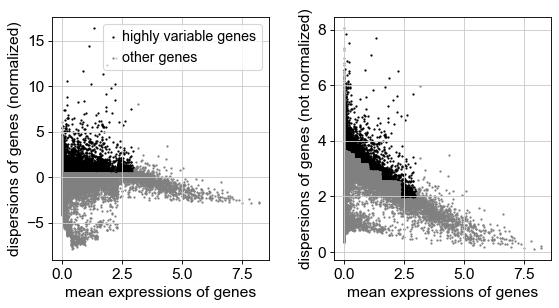

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:00:33)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


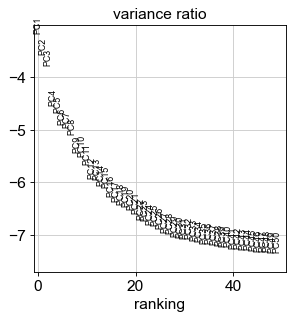

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [27]:
sc.pp.normalize_total(adata, exclude_highly_expressed=True)
sc.pp.log1p(adata)

adata.raw = adata
sc.pp.highly_variable_genes(adata, flavor='cell_ranger')
print('Highly variable genes: %d' %sum(adata.var.highly_variable))

sc.pl.highly_variable_genes(adata)

adata = adata[:, adata.var['highly_variable']]

sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack', n_comps=50)
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

sc.pp.neighbors(adata, n_pcs=40, n_neighbors=20)
sc.tl.umap(adata)

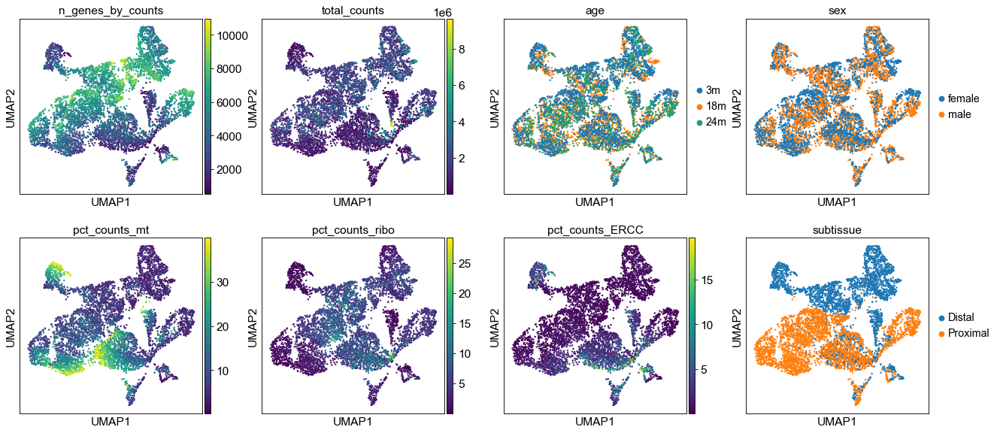

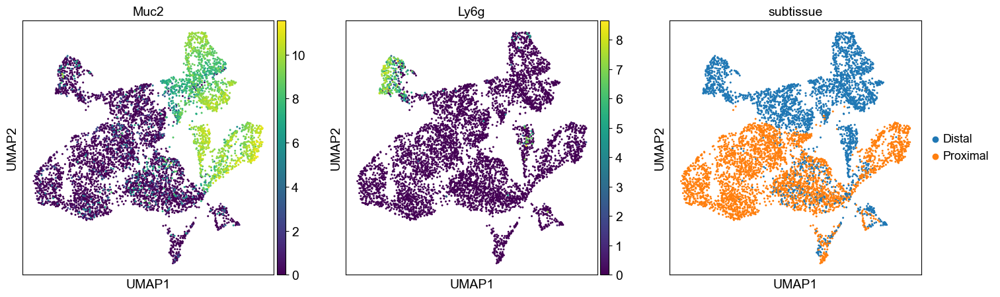

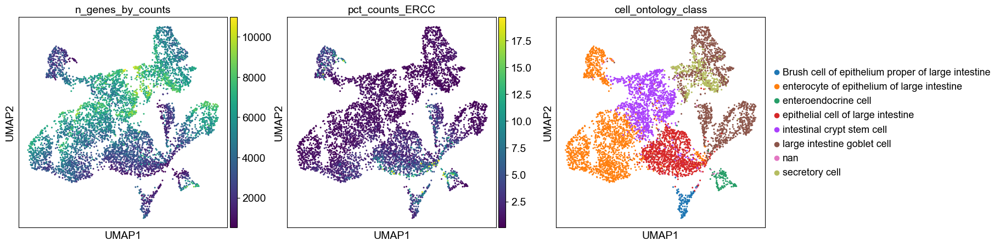

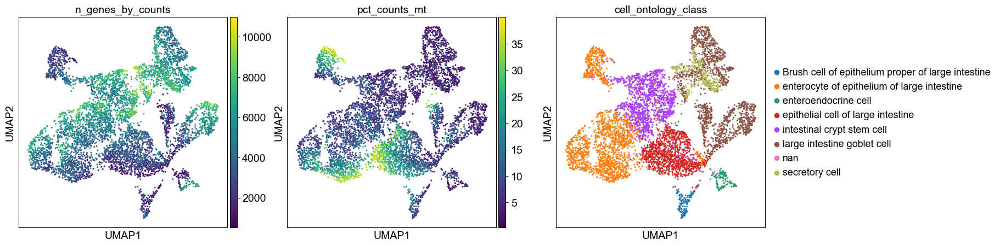

In [28]:
sc.pl.umap(adata, color=['n_genes_by_counts', 'total_counts', 'age', 'sex', 'pct_counts_mt', 'pct_counts_ribo',
                         'pct_counts_ERCC', 'subtissue'])
with plt.rc_context({"figure.figsize": (5, 5), "figure.dpi": 100, "figure.frameon": False}):
    sc.pl.umap(adata, color=['Muc2', 'Ly6g', 'subtissue'])
with plt.rc_context({"figure.figsize": (5, 5), "figure.dpi": 100, "figure.frameon": False}):
    sc.pl.umap(adata, color=['n_genes_by_counts', 'pct_counts_ERCC',  'cell_ontology_class'])
with plt.rc_context({"figure.figsize": (5, 5), "figure.dpi": 100, "figure.frameon": False}):
    sc.pl.umap(adata, color=['n_genes_by_counts', 'pct_counts_mt',  'cell_ontology_class'])    

computing tSNE
    using 'X_pca' with n_pcs = 40
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:15)


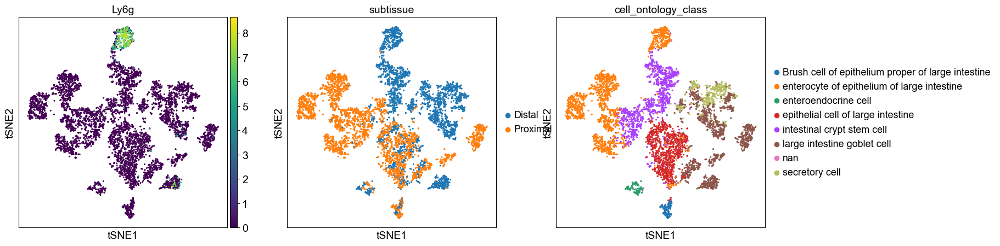

In [29]:
sc.tl.tsne(adata, n_pcs=40)
with plt.rc_context({"figure.figsize": (5, 5), "figure.dpi": 100, "figure.frameon": False}):
    sc.pl.tsne(adata, color=['Ly6g', 'subtissue', 'cell_ontology_class'])

## 10x 

In [30]:
adata_10x = sc.read_h5ad(work_dir + '10x_large_intestine.raw.h5ad')
adata_10x

AnnData object with n_obs × n_vars = 1636 × 38268
    obs: 'n_genes', 'index', 'age', 'batch', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_counts', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'louvain', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'Chromosome', 'Source', 'gene_id', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'doublet_info_colors', 'hvg', 'neighbors', 'pca', 'tissue_colors', 'umap'
    obsm: 'X_pca', 'X_umap'

In [31]:
adata_facs = sc.read_h5ad(work_dir + 'facs_large_intestine.raw.filtered.h5ad')

In [32]:
adata_int = adata_facs.concatenate(adata_10x)

In [33]:
adata_int.obs.batch.value_counts()

0    6361
1    1636
Name: batch, dtype: int64

In [34]:
adata_int.X[:10, :10].todense()

matrix([[  0.,   0., 325.,   1.,   0.,   0.,  23.,   0., 436.,   0.],
        [  0.,   0., 261.,   0.,   0.,   0.,   0.,   0., 187.,   0.],
        [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  26.,   0.],
        [  0.,   0.,   0.,   0.,   0.,   0.,   2.,   0.,   0.,   0.],
        [218.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 122.,   0.],
        [  0.,   0.,  62.,   0.,   0.,  98.,   0.,   0., 231.,   0.],
        [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  25.,   0.],
        [ 93.,   0.,  57.,   2.,   0.,   0.,   0.,   0., 198.,   0.]],
       dtype=float32)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['9530053A07Rik', 'Actb', 'Actr2', 'Agr2', 'Atp5j', 'Car1', 'Cdkn1b', 'Cdkn1c', 'Chga', 'Chgb', 'Clca1', 'Cldn4', 'Cox4i1', 'Crip1', 'Dctn4', 'Fabp2', 'Fabp6', 'Fcgbp', 'Fos', 'Foxo3', 'Fth1', 'Gcg', 'Gm10800', 'Gm10925', 'Gm28437', 'Gm42418', 'Guca2a', 'Hist1h1c', 'Ier2', 'Insl5', 'Jun', 'Kdelr2', 'Klk1', 'Krt18', 'Krt8', 'Lgals3', 'Lypd8', 'Mcmbp', 'Mptx1', 'Muc2', 'Neat1', 'Nfia', 'Phgr1', 'Ppy', 'Prdx6', 'Pyy', 'Reg3b', 'Reg3g', 'Reg4', 'Rn7sk', 'Rpsa', 'S100a6', 'Sct', 'Slc39a1', 'Smim10l1', 'Sod1', 'Spink1', 'Spink4', 'Sst', 'Sycn', 'Tff3', 'Tgm4', 'Zg16']
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Highly variable genes: 5709


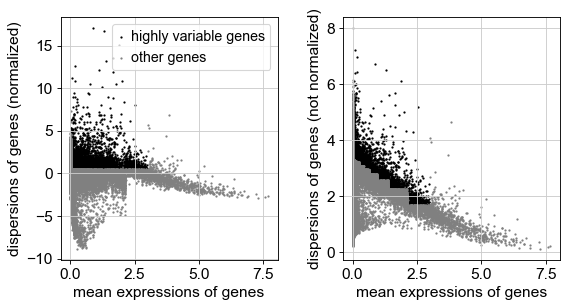

/Users/feifei/miniconda3/envs/scrna-macro/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:810: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


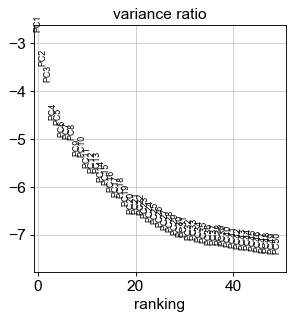

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
... storing 'FACS.selection' as categorical
... storing 'age' as categorical
... storing 'cell_ontology_class' as categorical
... storing 'cell_ontology_id' as categorical
... storing 'free_annotation' as categorical
... storing 'method' as categorical
... storing 'mouse.id' as categorical
... storing 'sex' as categorical
... storing 'subtissue' as categorical
... storing 'index' as categorical
... storing 'tissue_free_annotation' as categorical
... storing 'predicted_doublets' as categorical
... storing 'doublet_info' as categorical


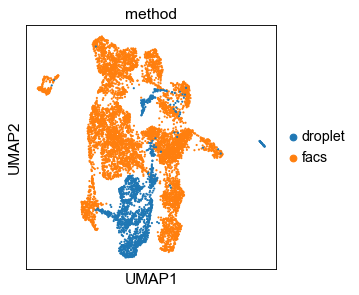

In [35]:
sc.pp.normalize_total(adata_int, exclude_highly_expressed=True)
sc.pp.log1p(adata_int)

adata_int.raw = adata_int
sc.pp.highly_variable_genes(adata_int, flavor='cell_ranger')
print('Highly variable genes: %d' %sum(adata_int.var.highly_variable))

sc.pl.highly_variable_genes(adata_int)

adata_int = adata_int[:, adata_int.var['highly_variable']]

sc.pp.scale(adata_int, max_value=10)
sc.tl.pca(adata_int, svd_solver='arpack', n_comps=50)
sc.pl.pca_variance_ratio(adata_int, log=True, n_pcs=50)

sc.pp.neighbors(adata_int, n_pcs=40, n_neighbors=20)
sc.tl.umap(adata_int)

sc.pl.umap(adata_int, color='method')

### BBKN

In [36]:
sc.external.pp.bbknn(adata_int, 
                      batch_key='batch', 
                      approx=True, metric='angular',
                      n_pcs=50, trim=None, n_trees=10, 
                      use_faiss=True, set_op_mix_ratio=1.0, local_connectivity=1)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [37]:
sc.tl.umap(adata_int)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


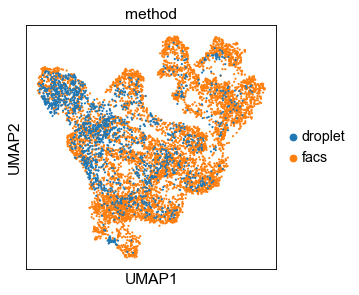

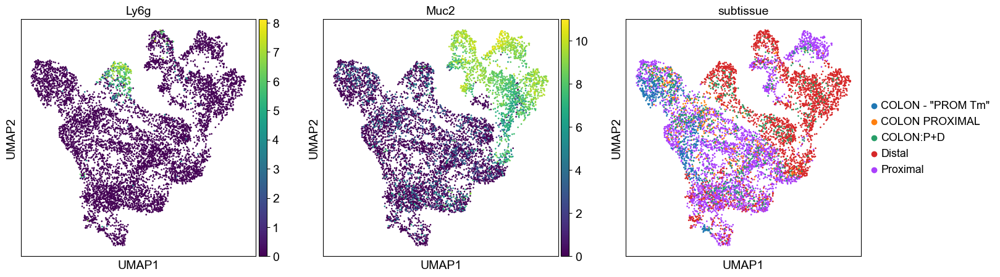

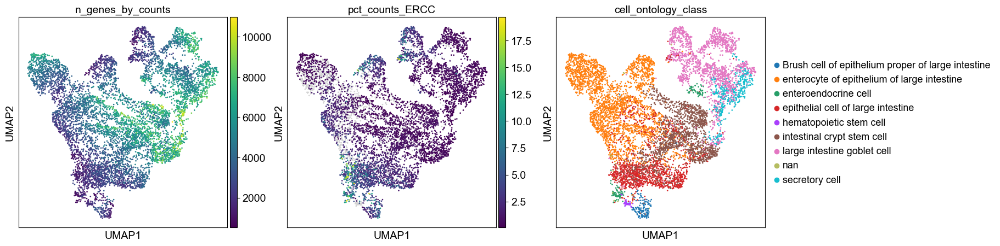

In [38]:
sc.pl.umap(adata_int, color='method', show=False)
with plt.rc_context({"figure.figsize": (5, 5), "figure.dpi": 100, "figure.frameon": False}):
    sc.pl.umap(adata_int, color=['Ly6g', 'Muc2', 'subtissue'])
with plt.rc_context({"figure.figsize": (5, 5), "figure.dpi": 100, "figure.frameon": False}):
    sc.pl.umap(adata_int, color=['n_genes_by_counts', 'pct_counts_ERCC',  'cell_ontology_class'])

## Clustering

running Leiden clustering
    finished: found 19 clusters and added
    'leiden_1.0', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)


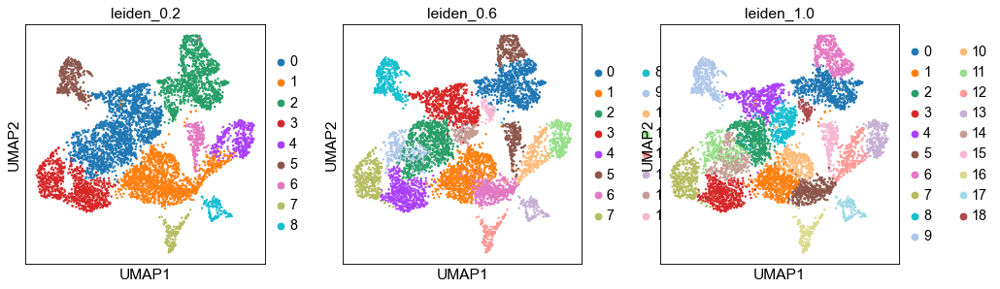

In [39]:
sc.tl.leiden(adata, key_added='leiden_1.0') # default resolution is 1.0
sc.tl.leiden(adata, key_added='leiden_0.2', resolution=0.2) # default resolution is 1.0
sc.tl.leiden(adata, key_added='leiden_0.6', resolution=0.6) # default resolution is 1.0

sc.pl.umap(adata, color=['leiden_0.2', 'leiden_0.6', 'leiden_1.0'])

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 16 clusters and added
    'louvain_1.0', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain_0.6', the cluster labels (adata.obs, categorical) (0:00:00)


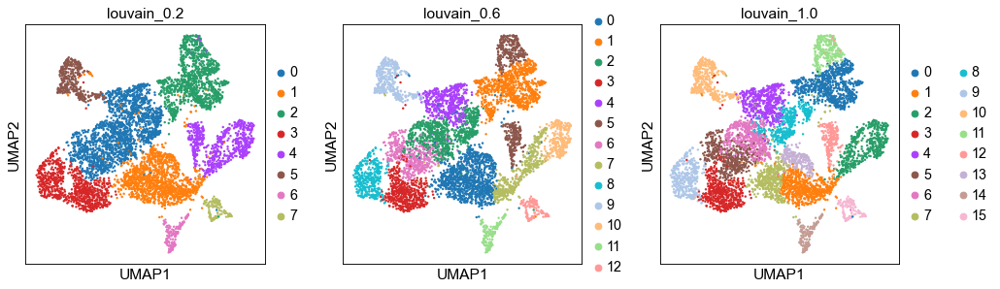

In [40]:
sc.tl.louvain(adata, key_added='louvain_1.0') # default resolution is 1.0
sc.tl.louvain(adata, key_added='louvain_0.2', resolution=0.2) # default resolution is 1.0
sc.tl.louvain(adata, key_added='louvain_0.6', resolution=0.6) # default resolution is 1.0

sc.pl.umap(adata, color=['louvain_0.2', 'louvain_0.6', 'louvain_1.0'])

running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain_0.3', the cluster labels (adata.obs, categorical) (0:00:00)


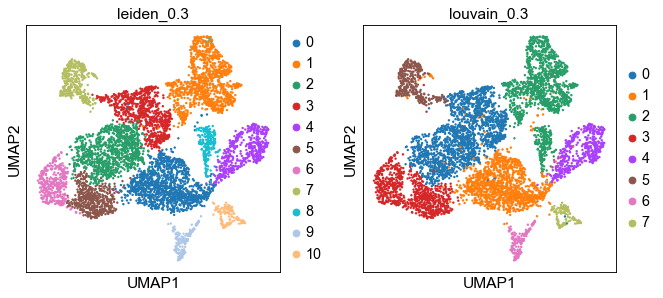

In [41]:
sc.tl.leiden(adata, key_added='leiden_0.3', resolution=0.3)
sc.tl.louvain(adata, key_added='louvain_0.3', resolution=0.3)

sc.pl.umap(adata, color=['leiden_0.3', 'louvain_0.3'])

## DE

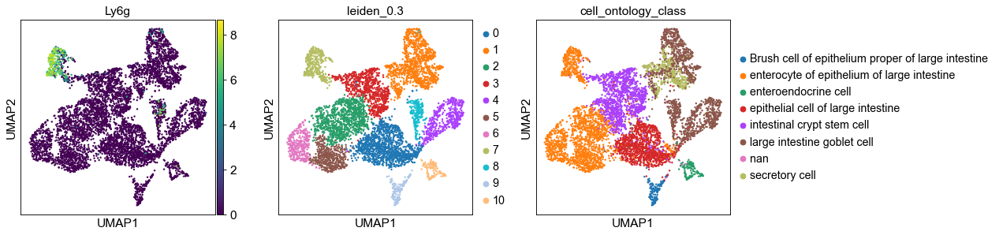

In [42]:
sc.pl.umap(adata, color=['Ly6g', 'leiden_0.3', 'cell_ontology_class'])

In [43]:
from importlib import reload  
import plot_func
import de_enr
reload(de_enr)
reload(plot_func)
#reload(venn)
from de_enr import *
from plot_func import *

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


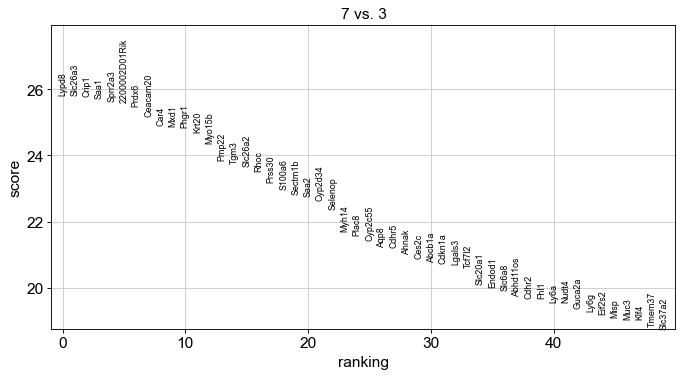

/Users/feifei/Projects/mini_scrnaseq/de_enr.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


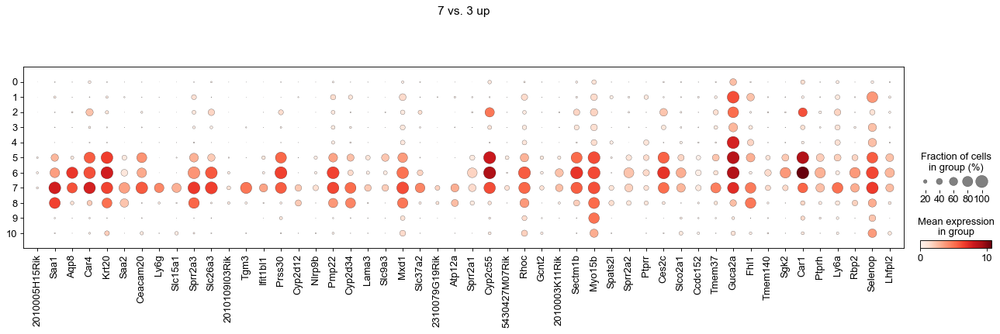

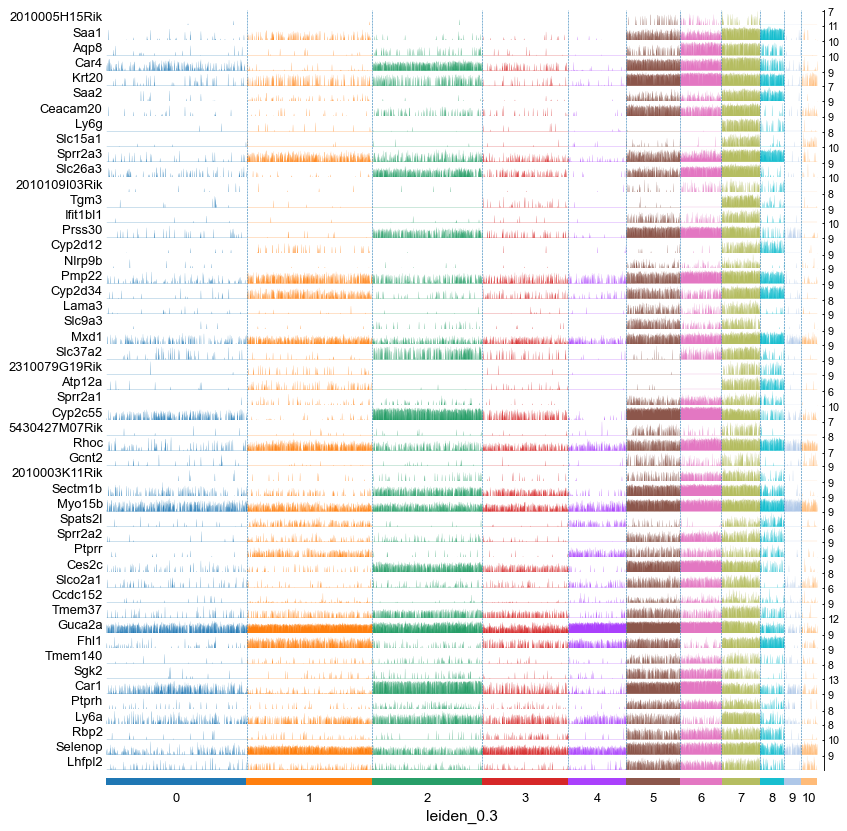

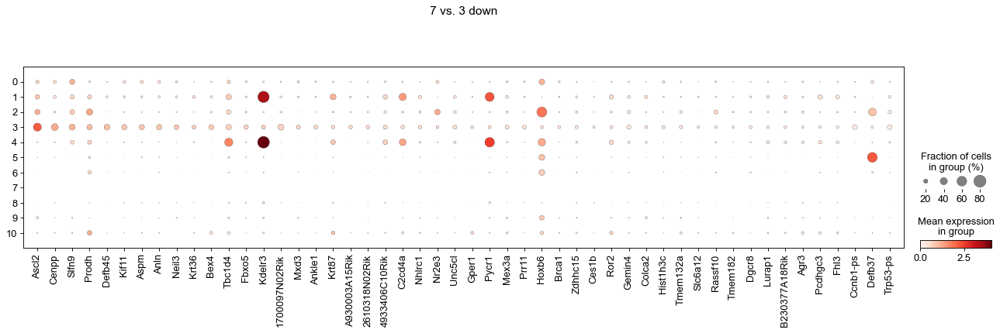

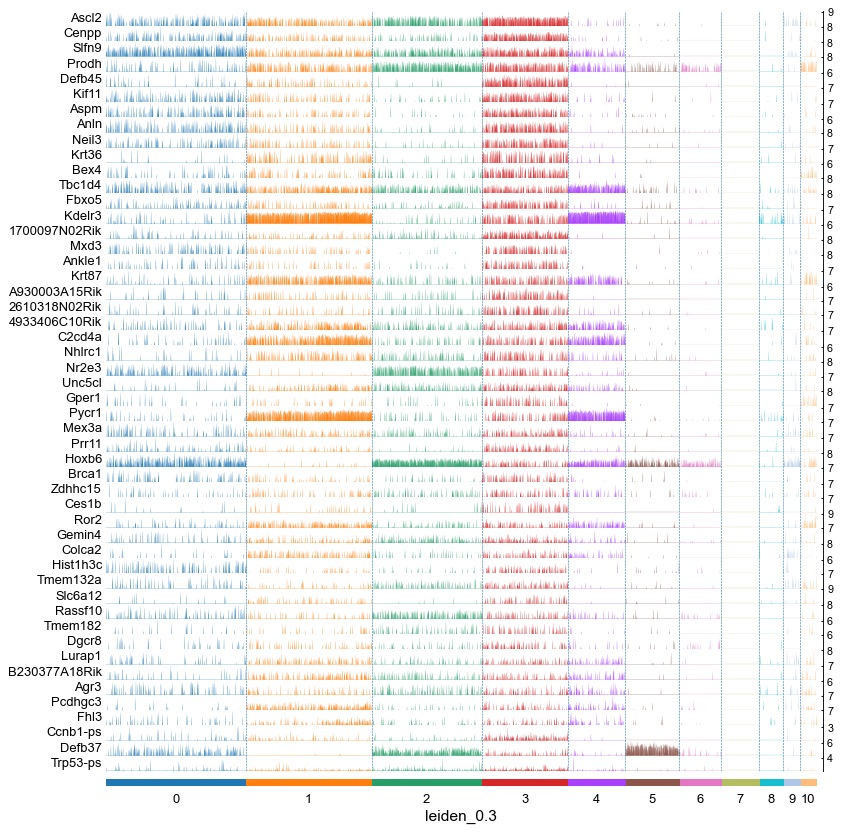

9367 sig_genes, with 706 up and 8661 down


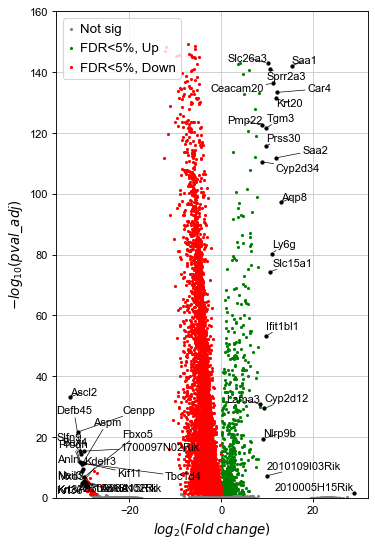

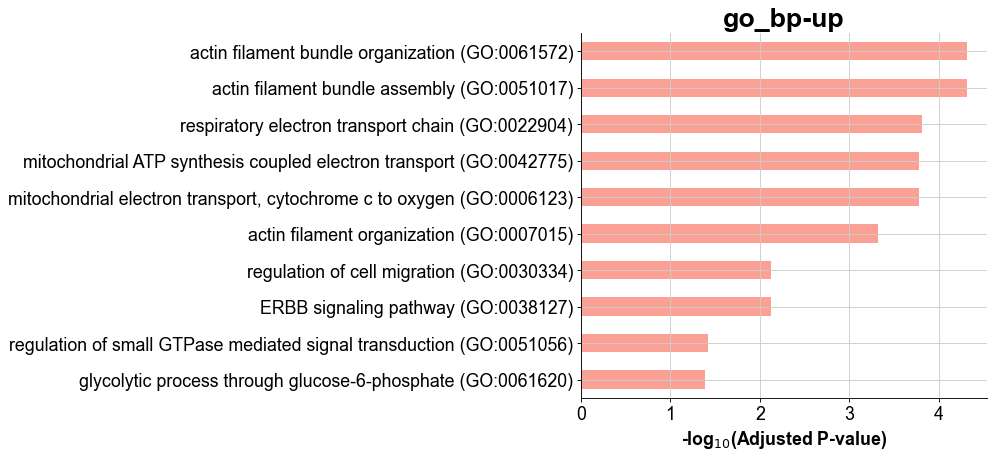

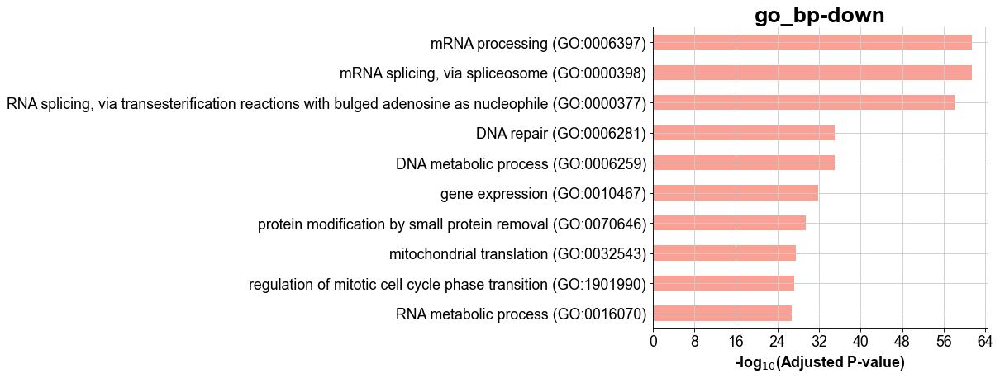

In [44]:
sig_genes = rank_and_enr(adata, '7', '3', 'leiden_0.3', use_raw=True, work_dir='./data/csv/', method='wilcoxon', n_genes=50, cutoff=0.05)

## Trajectory analysis

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:24)


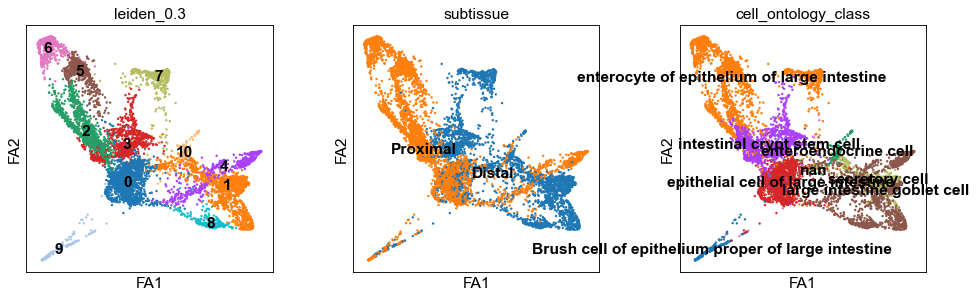

In [45]:
sc.tl.draw_graph(adata)
sc.pl.draw_graph(adata, color=['leiden_0.3', 'subtissue','cell_ontology_class'], legend_loc='on data')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


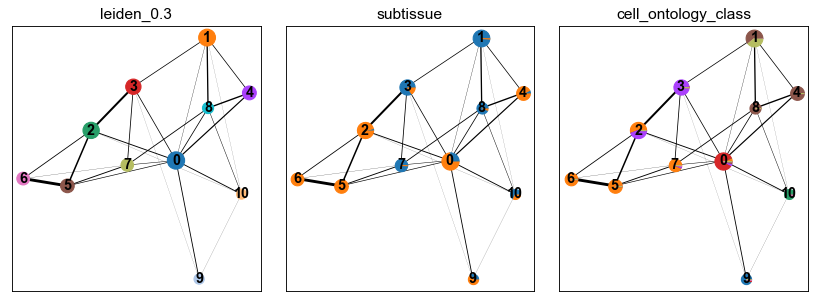

In [46]:
sc.tl.paga(adata, groups='leiden_0.3')
sc.pl.paga(adata, color=['leiden_0.3', 'subtissue','cell_ontology_class'])

In [ ]:
sc.tl.draw_graph(adata, init_pos='paga')
sc.pl.draw_graph(adata, color=['leiden_0.3', 'subtissue','cell_ontology_class'], legend_loc='on data')

drawing single-cell graph using layout 'fa'


In [ ]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['cell_ontology_class'] == 'intestinal crypt stem cell')[0]
sc.tl.diffmap(adata)
sc.tl.dpt(adata)
sc.pl.draw_graph(adata, color=['leiden_0.3', 'dpt_pseudotime', 'cell_ontology_class'], legend_loc='on data')